In [ ]:
# Connect google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installing Tensorflow gpu
!pip install tensorflow-gpu

# installing compatible cuda version
!dpkg -i "/content/drive/MyDrive/libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 511.7 MB 6.5 kB/s 
     |████████████████████████████████| 438 kB 67.4 MB/s 
     |████████████████████████████████| 5.8 MB 38.6 MB/s 
     |████████████████████████████████| 1.6 MB 54.5 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: keras
    Found existing installation: keras 2.8.0
    Uninstalling keras-2.8.0:
      Successfully uninstalled keras-2.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Successfully uninstalled gast-0.

In [ ]:
# Installing tensorflow 2.7
!pip install tensorflow==2.7.0
import tensorflow as tf
print(tf.__version__)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 665.5 MB 143.2 MB/s
     |████████████████████████████████| 463 kB 5.0 MB/s 
     |████████████████████████████████| 1.3 MB 64.8 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.2+zzzcolab20220527125636
    Uninstalling tensorflow-2.8.2+zzzcolab20220527125636:
      Successfully uninstalled tensorflow-2.8.2+zzzcolab20220527125636
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency co

In [ ]:
import os

In [ ]:
custom_model_name = 'my_efficientdet_d0_coco17_tpu-32' 
pretrained_model_name = 'efficientdet_d0_coco17_tpu-32'
pretrained_model_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz'
tf_record_script_name = 'generate_tfrecord.py'
label_map_name = 'label_map.pbtxt'
drive = '/content/drive/MyDrive'

In [ ]:
paths = {
    'workspace_path': os.path.join('Tensorflow', 'workspace'),
    'scripts_path': os.path.join('Tensorflow','scripts'),
    'apimodel_path': os.path.join('Tensorflow','models'),
    'annotation_path': os.path.join('Tensorflow', 'workspace','annotations'),
    'image_path': os.path.join('Tensorflow', 'workspace','images'),
    'model_path': os.path.join(drive,'trained_models'),
    'pretrained_model_path': os.path.join('Tensorflow', 'workspace','pre-trained-models'),
    'checkpoint_path': os.path.join(drive,'trained_models',custom_model_name),
    'output_path': os.path.join(drive,'trained_models',custom_model_name, 'export'), 
    'tfjs_path':os.path.join(drive,'trained_models',custom_model_name, 'tfjs_export'), 
    'tflite_path':os.path.join(drive,'trained_models',custom_model_name, 'tflite_export'), 
    'protoc_path':os.path.join('Tensorflow','protoc')
 }

In [ ]:
paths['checkpoint_path']

'/content/drive/MyDrive/trained_models/my_efficientdet_d0_coco17_tpu-32'

In [ ]:
files = {
    'pipeline_config':os.path.join(drive,'trained_models',custom_model_name, 'pipeline.config'),
    'tf_record_script': os.path.join(paths['scripts_path'], tf_record_script_name), 
    'labelmap': os.path.join(paths['annotation_path'], label_map_name)
}

In [ ]:
for path in paths.values():
    if not os.path.exists(path):
        if os.name == 'posix':
            !mkdir -p {path}
        if os.name == 'nt':
            !mkdir {path}

## **Cloning TFOD 2.0 Github**

In [ ]:
if not os.path.exists(os.path.join(paths['apimodel_path'], 'research', 'object_detection')):
    !git clone https://github.com/tensorflow/models {paths['apimodel_path']}

Cloning into 'Tensorflow/models'...
remote: Enumerating objects: 74673, done.
remote: Counting objects: 100% (161/161), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 74673 (delta 78), reused 129 (delta 62), pack-reused 74512
Receiving objects: 100% (74673/74673), 580.36 MiB | 37.29 MiB/s, done.
Resolving deltas: 100% (52978/52978), done.


# **COCO API installation**

In [ ]:
if not os.path.exists(os.path.join(paths['apimodel_path'], 'research', 'cocoapi')):
    !git clone https://github.com/cocodataset/cocoapi {os.path.join(paths['apimodel_path'],'research','cocoapi')}
    
!cd {os.path.join(paths['apimodel_path'],'research','cocoapi','PythonAPI')} && make && cd /content


Cloning into 'Tensorflow/models/research/cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 25.99 MiB/s, done.
Resolving deltas: 100% (576/576), done.
make: *** No targets specified and no makefile found.  Stop.


In [ ]:
!cp -r {os.path.join(paths['apimodel_path'],'research','cocoapi','PythonAPI','pycocotools')} {os.path.join(paths['apimodel_path'],'research')}

cp: cannot stat 'Tensorflow/models/research/cocoapi/PythonAPI/pycocotools': No such file or directory


## Compile protoc file, installing Tensorflow Object Detection and installing python

In [ ]:
if os.name=='posix':  
    !apt-get install protobuf-compiler
    !cd Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install . 


Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
You might want to run 'apt --fix-broken install' to correct these.
The following packages have unmet dependencies:
 libcudnn8-dev : Depends: libcudnn8 (= 8.0.5.39-1+cuda11.1) but 8.1.0.77-1+cuda11.2 is to be installed
E: Unmet dependencies. Try 'apt --fix-broken install' with no packages (or specify a solution).
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/Tensorflow/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/py

# **Test your Installation**

In [ ]:
VERIFICATION_SCRIPT = os.path.join(paths['apimodel_path'], 'research', 'object_detection', 'builders', 'model_builder_tf2_test.py')
# Verify Installation
!python {VERIFICATION_SCRIPT}

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-06-23 09:22:47.696281: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0623 09:22:47.936216 139685139298176 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 1.51s
I0623 09:22:48.319930 139685139298176 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 1.51s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.54s
I0623 09:22:48.863611 139685139298176 test_u

# **Creating label_map.pbtxt from our classes**

In [ ]:
labels = [{
    "name": "0","id": 1},
{
  "name": "1",
  "id": 2
},
{
  "name": "2",
  "id": 3
},
{
  "name": "3",
  "id": 4
},
{
  "name": "4",
  "id": 5
},
{
  "name": "5",
  "id": 6
},
{
  "name": "6",
  "id": 7
},
{
  "name": "7",
  "id": 8
},
{
  "name": "8",
  "id": 9
},
{
  "name": "9",
  "id": 10
},
{
  "name": "A",
  "id": 11
},
{
  "name": "B",
  "id": 12
},
{
  "name": "C",
  "id": 13
},
{
  "name": "D",
  "id": 14
},
{
  "name": "E",
  "id": 15
},
{
  "name": "F",
  "id": 16
},
{
  "name": "G",
  "id": 17
},
{
  "name": "H",
  "id": 18
},
{
  "name": "I",
  "id": 19
},
{
  "name": "J",
  "id": 20
},
{
  "name": "K",
  "id": 21
},
{
  "name": "L",
  "id": 22
},
{
  "name": "M",
  "id": 23
},
{
  "name": "N",
  "id": 24
},
{
  "name": "O",
  "id": 25
},
{
  "name": "P",
  "id": 26
},
{
  "name": "Q",
  "id": 27
},
{
  "name": "R",
  "id": 28
},
{
  "name": "S",
  "id": 29
},
{
  "name": "T",
  "id": 30
},
{
  "name": "U",
  "id": 31
},
{
  "name": "V",
  "id": 32
},
{
  "name": "W",
  "id": 33
},
{
  "name": "X",
  "id": 34
},
{
  "name": "Y",
  "id": 35
},
{
  "name": "Z",
  "id": 36

}] # Update labels based on annotations

with open(files['labelmap'], 'w') as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

# **Create TensorFlow Records**

In [ ]:
if not os.path.exists(files['tf_record_script']):
    !git clone https://github.com/gourav300/xml_to_tfrecord_generation {paths['scripts_path']}

Cloning into 'Tensorflow/scripts'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (3/3), done.


In [ ]:
!python {files['tf_record_script']} -x {os.path.join(paths['image_path'], 'train')} -l {files['labelmap']} -o {os.path.join(paths['annotation_path'], 'train.record')} 
!python {files['tf_record_script']} -x {os.path.join(paths['image_path'], 'validation')} -l {files['labelmap']} -o {os.path.join(paths['annotation_path'], 'validation.record')}
!python {files['tf_record_script']} -x {os.path.join(paths['image_path'], 'test')} -l {files['labelmap']} -o {os.path.join(paths['annotation_pa

# **Download Pre-Trained Model**

In [ ]:
if os.name =='posix':
    !wget {pretrained_model_url}
    !mv {pretrained_model_name+'.tar.gz'} {paths['pretrained_model_path']}
    !cd {paths['pretrained_model_path']} && tar -zxvf {pretrained_model_name+'.tar.gz'}

--2022-06-23 09:23:53--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.161.128, 2607:f8b0:4001:c5c::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.161.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M   126MB/s    in 0.2s    

2022-06-23 09:23:54 (126 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]

efficientdet_d0_coco17_tpu-32/
efficientdet_d0_coco17_tpu-32/checkpoint/
efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0.data-00000-of-00001
efficientdet_d0_coco17_tpu-32/checkpoint/checkpoint
efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0.index
efficientdet_d0_coco17_tpu-32/pipeline.config
efficientdet_d0_coco17_tpu-32/saved_model/
efficientdet

## Copy Model Config to Training Folder

In [ ]:
if os.name =='posix':
    !cp {os.path.join(paths['pretrained_model_path'], pretrained_model_name, 'pipeline.config')} {os.path.join(paths['checkpoint_path'])}

## Update Config For Transfer Learning

In [ ]:
import object_detection
import tensorflow as tf
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

--2022-06-14 08:36:48--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.142.128, 2607:f8b0:400e:c06::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.142.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M   119MB/s    in 0.2s    

2022-06-14 08:36:48 (119 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8

In [ ]:
config = config_util.get_configs_from_pipeline_file(files['pipeline_config'])

In [ ]:
config

{'eval_config': metrics_set: "coco_detection_metrics"
 use_moving_averages: false
 batch_size: 1,
 'eval_input_config': label_map_path: "PATH_TO_BE_CONFIGURED/label_map.txt"
 shuffle: false
 num_epochs: 1
 tf_record_input_reader {
   input_path: "PATH_TO_BE_CONFIGURED/val2017-?????-of-00032.tfrecord"
 },
 'eval_input_configs': [label_map_path: "PATH_TO_BE_CONFIGURED/label_map.txt"
 shuffle: false
 num_epochs: 1
 tf_record_input_reader {
   input_path: "PATH_TO_BE_CONFIGURED/val2017-?????-of-00032.tfrecord"
 }
 ],
 'model': ssd {
   num_classes: 90
   image_resizer {
     keep_aspect_ratio_resizer {
       min_dimension: 512
       max_dimension: 512
       pad_to_max_dimension: true
     }
   }
   feature_extractor {
     type: "ssd_efficientnet-b0_bifpn_keras"
     conv_hyperparams {
       regularizer {
         l2_regularizer {
           weight: 3.9999998989515007e-05
         }
       }
       initializer {
         truncated_normal_initializer {
           mean: 0.0
           st

In [ ]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(files['pipeline_config'], "r") as f:                                                                                                                                                                                                                     
    proto_str = f.read()                                                                                                                                                                                                                                          
    text_format.Merge(proto_str, pipeline_config) 

In [ ]:
pipeline_config.model.ssd.num_classes = len(labels)
pipeline_config.train_config.batch_size = 4
pipeline_config.train_config.fine_tune_checkpoint = os.path.join(paths['pretrained_model_path'], pretrained_model_name, 'checkpoint', 'ckpt-0')
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path= files['labelmap']
pipeline_config.train_input_reader.tf_record_input_reader.input_path[:] = [os.path.join(paths['annotation_path'], 'train.record')]
pipeline_config.eval_input_reader[0].label_map_path = files['labelmap']
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[:] = [os.path.join(paths['annotation_path'], 'validation.record')]

In [ ]:
config_text = text_format.MessageToString(pipeline_config)                                                                                                                                                                                                        
with tf.io.gfile.GFile(files['pipeline_config'], "wb") as f:                                                                                                                                                                                                                     
    f.write(config_text)   

# **Training the Model**

In [ ]:
cd /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo

/content/drive/MyDrive/anpr_tensorflow/workspace/training_demo


In [ ]:
!pip list

Package                       Version
----------------------------- ------------------------------
absl-py                       1.1.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.2.0
apache-beam                   2.39.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arviz                         0.12.1
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
atari-py                      0.2.9
atomicwrites                  1.4.0
attrs                         21.4.0
audioread                     2.1.9
autograd                      1.4
avro-python3                  1.10.2
Babel                         2.10.2
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.0
blis                          0.7.7
bokeh                         2.3.3
branca                        

In [ ]:
!pip uninstall opencv-python-headless==4.6.0.66

Found existing installation: opencv-python-headless 4.6.0.66
Uninstalling opencv-python-headless-4.6.0.66:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.6.0.66.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-5896f664.so.58.134.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-8ef5c7db.so.58.76.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-9c768859.so.56.70.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-d21001fc.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libgfortran-91cc3cb1.so.3.0.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libopenblas-r0-f650aae0.3.3.so
    /usr/local/lib/python3.7/dis

In [ ]:
!pip install opencv-python-headless==4.1.2.30

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.8 MB 1.3 MB/s 


In [ ]:
training_sript = os.path.join(paths['apimodel_path'], 'research', 'object_detection', 'model_main_tf2.py')

In [ ]:
# to run on command promp
command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=200000".format(training_sript, paths['checkpoint_path'],files['pipeline_config'])
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=/content/drive/MyDrive/trained_models/my_efficientdet_d0_coco17_tpu-32 --pipeline_config_path=/content/drive/MyDrive/trained_models/my_efficientdet_d0_coco17_tpu-32/pipeline.config --num_train_steps=200000


In [ ]:
!{command}

2022-06-23 09:29:31.735916: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0623 09:29:31.743071 139887029700480 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 200000
I0623 09:29:31.750607 139887029700480 config_util.py:552] Maybe overwriting train_steps: 200000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0623 09:29:31.750780 139887029700480 config_util.py:552] Maybe overwriting use_bfloat16: False
I0623 09:29:31.758004 139887029700480 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b0
I0623 09:29:31.758119 139887029700480 ssd_efficientnet_bifpn_feature_extractor.py:147

In [ ]:
cd /content/drive/MyDrive/trained_models/my_ssd_mobilenet_v2_fpnlite_320x320

/content/drive/MyDrive/trained_models/my_ssd_mobilenet_v2_fpnlite_320x320


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=.

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Evaluate the Model

In [ ]:
# to run on command promp
eval_command = "python {} --model_dir={} --pipeline_config_path={} --checkpoint_dir={}".format(training_sript, paths['checkpoint_path'],files['pipeline_config'], paths['checkpoint_path'])
print(eval_command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=/content/drive/MyDrive/trained_models/my_ssd_mobilenet_v2_fpnlite_320x320 --pipeline_config_path=/content/drive/MyDrive/trained_models/my_ssd_mobilenet_v2_fpnlite_320x320/pipeline.config --checkpoint_dir=/content/drive/MyDrive/trained_models/my_ssd_mobilenet_v2_fpnlite_320x320


In [ ]:
!{eval_command}

python3: can't open file 'Tensorflow/models/research/object_detection/model_main_tf2.py': [Errno 2] No such file or directory


# **Exporting Model**

In [ ]:
cd /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo

/content/drive/MyDrive/anpr_tensorflow/workspace/training_demo


In [ ]:
!python /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/models/my_efficientdet-d0/pipeline.config --trained_checkpoint_dir /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/models/my_efficientdet-d0 --output_directory /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/exported-models/my_model

2022-02-25 04:44:49.199435: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
I0225 04:44:49.742849 140557480068992 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b0
I0225 04:44:49.743087 140557480068992 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num filters: 64
I0225 04:44:49.743174 140557480068992 ssd_efficientnet_bifpn_feature_extractor.py:149] EfficientDet BiFPN num iterations: 3
I0225 04:44:49.747334 140557480068992 efficientnet_model.py:147] round_filter input=32 output=32
I0225 04:44:49.779120 140557480068992 efficientnet_model.py:147] round_filter input=32 output=32
I0225 04:44:49.779330 140557480068992 efficientnet_model.py:147] round_filter input=16 output=16
I0225 04:44:49.844825 140557480068992 efficientnet_model.py:147] round_filter input=16 output=16
I0225 04:44:49.844997 140557480068992 efficientnet_model.

# **Infrencing the Model**

Loading model...Done! Took 39.09971809387207 seconds
Running inference for /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/images/test/1PlateBaza477.jpg... Done


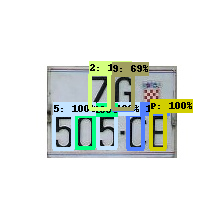

In [ ]:
"""
Object Detection (On Image) From TF2 Saved Model
=====================================
"""

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/images/test/1PlateBaza477.jpg'


# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/exported-models/my_model'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED


Running inference for /content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/images/test/1PlateBaza477.jpg... Done


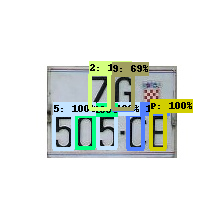

In [ ]:
# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/drive/MyDrive/anpr_tensorflow/workspace/training_demo/images/test/1PlateBaza477.jpg'

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED


In [ ]:
# !wget https://developer.nvidia.com/compute/cuda/8.0/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
# !dpkg -i cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb

# !apt-key add /var/cuda-repo-8-0-local-ga2/7fa2af80.pub
# !apt-get update
# !apt-get install cuda=8.0.61-1
# !apt autoremove

--2022-02-23 22:41:11--  https://developer.nvidia.com/compute/cuda/8.0/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
Resolving developer.nvidia.com (developer.nvidia.com)... 152.195.19.142
Connecting to developer.nvidia.com (developer.nvidia.com)|152.195.19.142|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://developer.nvidia.com/compute/cuda/8.0/prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb [following]
--2022-02-23 22:41:11--  https://developer.nvidia.com/compute/cuda/8.0/prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
Reusing existing connection to developer.nvidia.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://developer.download.nvidia.com/compute/cuda/8.0/secure/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64.deb?qUgYGWIv2Cz-mAifS4YCxA7G40p60XO1aS-y7RN7aVcyfweIvwq-Z-uUiGRbOciKcMN2k0yNMmzkU

In [ ]:
!pip install OpenNMT-tf

     |████████████████████████████████| 159 kB 5.1 MB/s 
     |████████████████████████████████| 16.3 MB 142 kB/s 
     |████████████████████████████████| 15.0 MB 53.6 MB/s 


In [ ]:
# mport tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'